In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df1 = pd.read_csv("prices_round_3_day_0.csv", sep=';')
df2 = pd.read_csv("prices_round_3_day_1.csv", sep=';')
df3 = pd.read_csv("prices_round_3_day_2.csv", sep=';')
df = pd.concat([df1, df2, df3])

In [3]:
df['product'].unique()

array(['VOLCANIC_ROCK_VOUCHER_10500', 'DJEMBES', 'CROISSANTS', 'JAMS',
       'VOLCANIC_ROCK_VOUCHER_10000', 'KELP',
       'VOLCANIC_ROCK_VOUCHER_9750', 'PICNIC_BASKET1', 'PICNIC_BASKET2',
       'VOLCANIC_ROCK_VOUCHER_9500', 'RAINFOREST_RESIN',
       'VOLCANIC_ROCK_VOUCHER_10250', 'SQUID_INK', 'VOLCANIC_ROCK'],
      dtype=object)

In [4]:
resin = df[df["product"]=="RAINFOREST_RESIN"]
kelp = df[df["product"]=="KELP"]
ink = df[df["product"]=="SQUID_INK"]
croissants = df[df["product"]=="CROISSANTS"]
jams = df[df["product"]=="JAMS"]
djembes = df[df["product"]=="DJEMBES"]
basket1 = df[df["product"]=="PICNIC_BASKET1"]
basket2 = df[df["product"]=="PICNIC_BASKET2"]
rock = df[df["product"]=="VOLCANIC_ROCK"]
rock_9500 = df[df['product']== 'VOLCANIC_ROCK_VOUCHER_9500']
rock_9750 = df[df['product']== 'VOLCANIC_ROCK_VOUCHER_9750']
rock_10000 = df[df['product']== 'VOLCANIC_ROCK_VOUCHER_10000']
rock_10250 = df[df['product']== 'VOLCANIC_ROCK_VOUCHER_10250']
rock_10500 = df[df['product']== 'VOLCANIC_ROCK_VOUCHER_10500']

<Axes: xlabel='timestamp', ylabel='mid_price'>

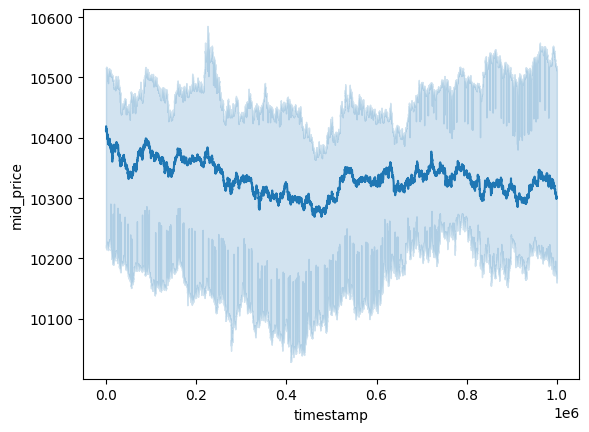

In [16]:
sns.lineplot(x=rock['timestamp'], y=rock['mid_price'])

In [5]:
rock_call10000 = rock_10000.merge(rock[['timestamp', 'mid_price']], on='timestamp', suffixes=('', '_coconut'))

In [29]:
print(rock['mid_price'].mean())
print(rock['mid_price'].std())

9954.972660296695
51.0082951733512


In [8]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=rock['timestamp'], y=rock['mid_price'], name='Coconut Mid Price'))
fig.add_trace(go.Scatter(x=rock_call10000['timestamp'], y=rock_call10000['mid_price'], name='Coconut Call Mid Price', yaxis='y2'))
fig.update_layout(title='Rock and Rock Call Prices over Timestamp', yaxis=dict(title='Coconut Mid Price'), yaxis2=dict(title='Coconut Call Bid Price', overlaying='y', side='right'))
fig.show()

### This average Implied Volatility was used in Round 4 last year.......so here are our details


Analyzing rock_9500 (Strike: 9500)...


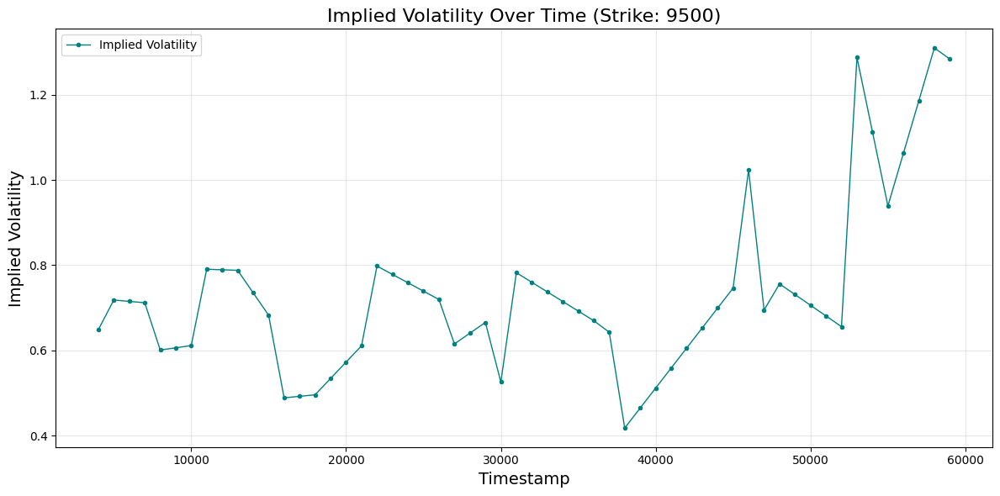

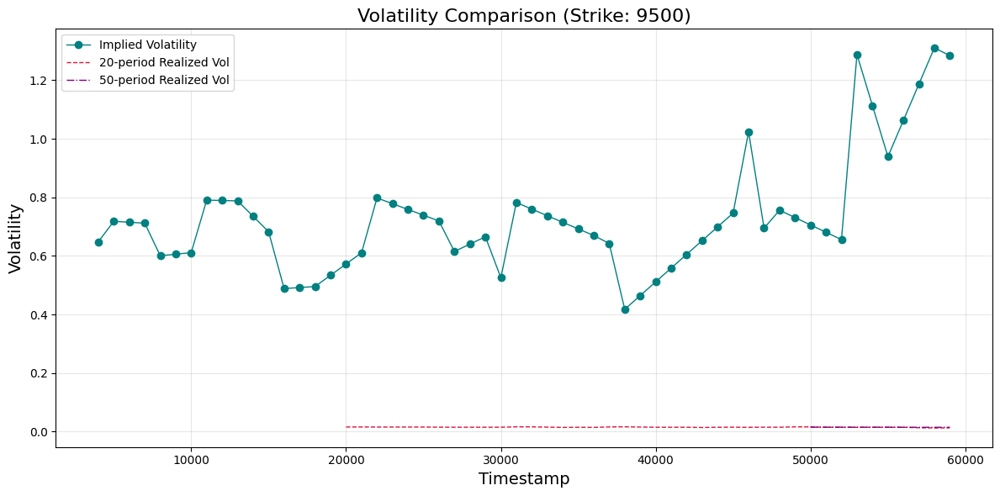

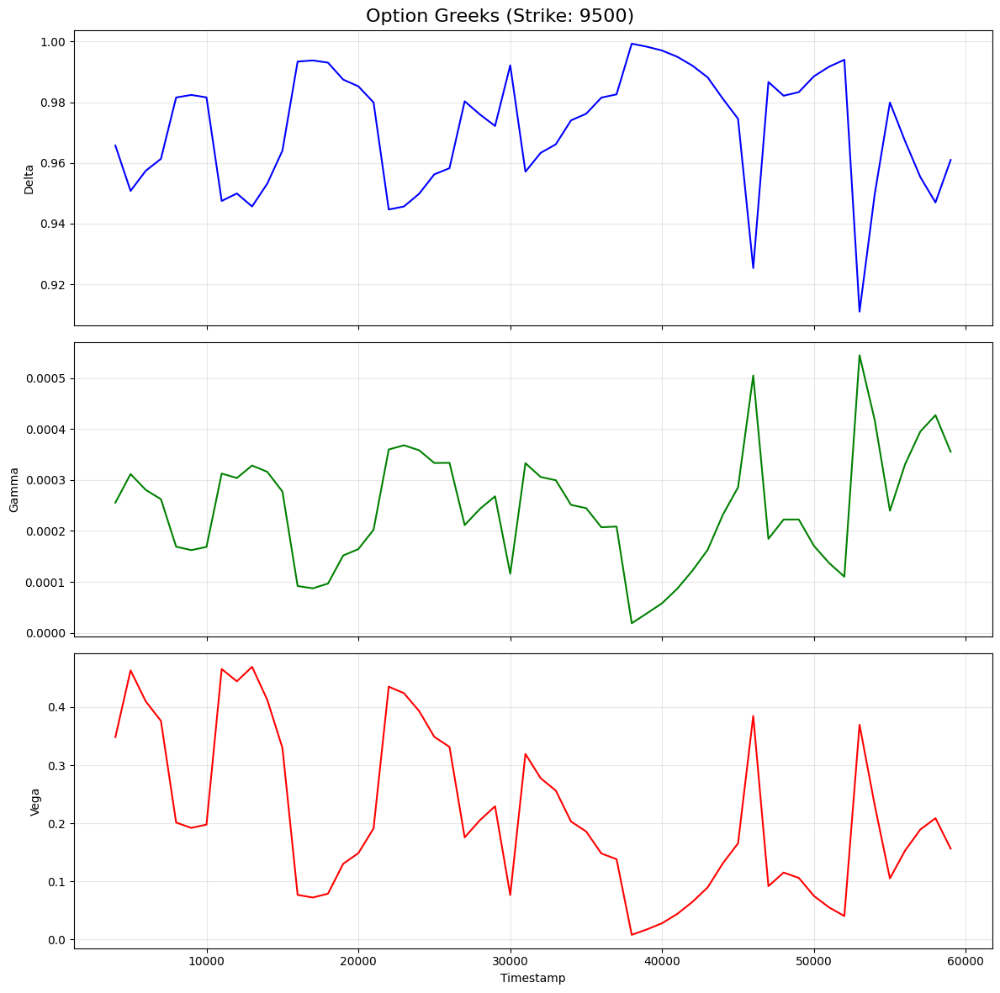


Analyzing rock_9750 (Strike: 9750)...


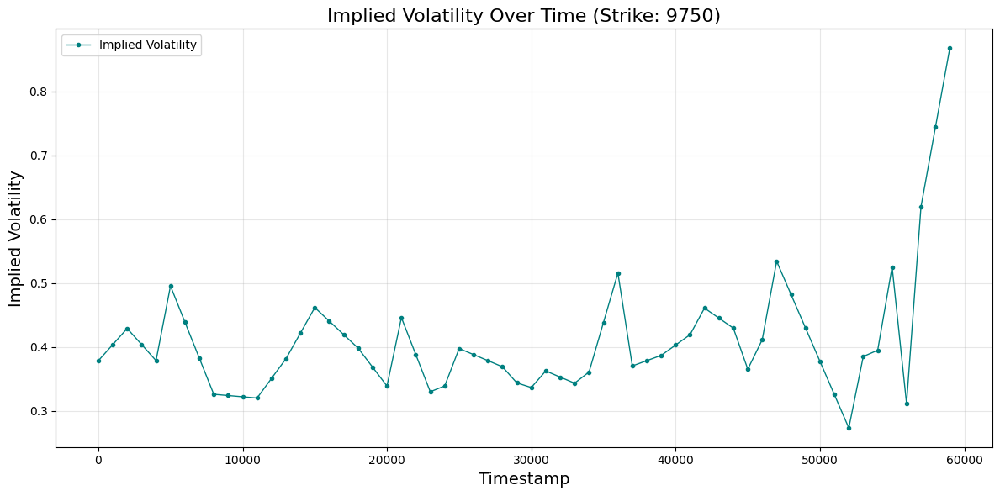

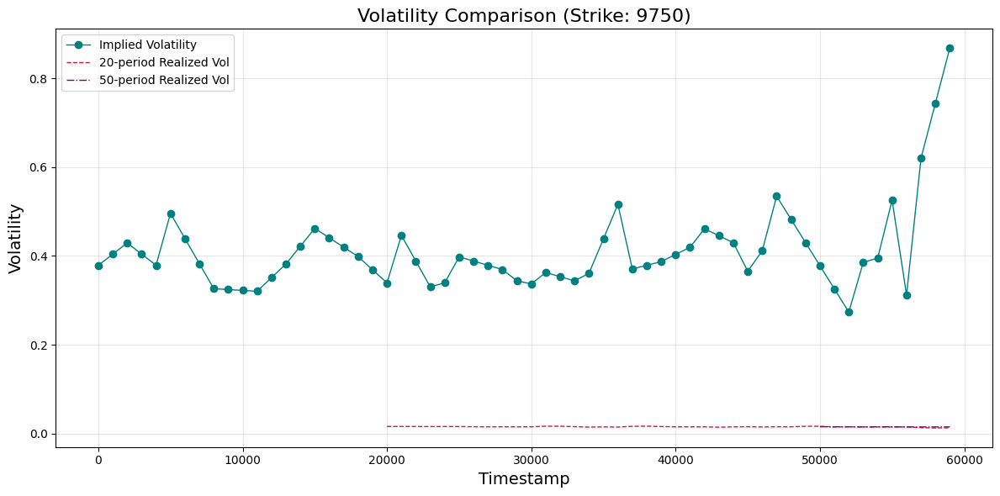

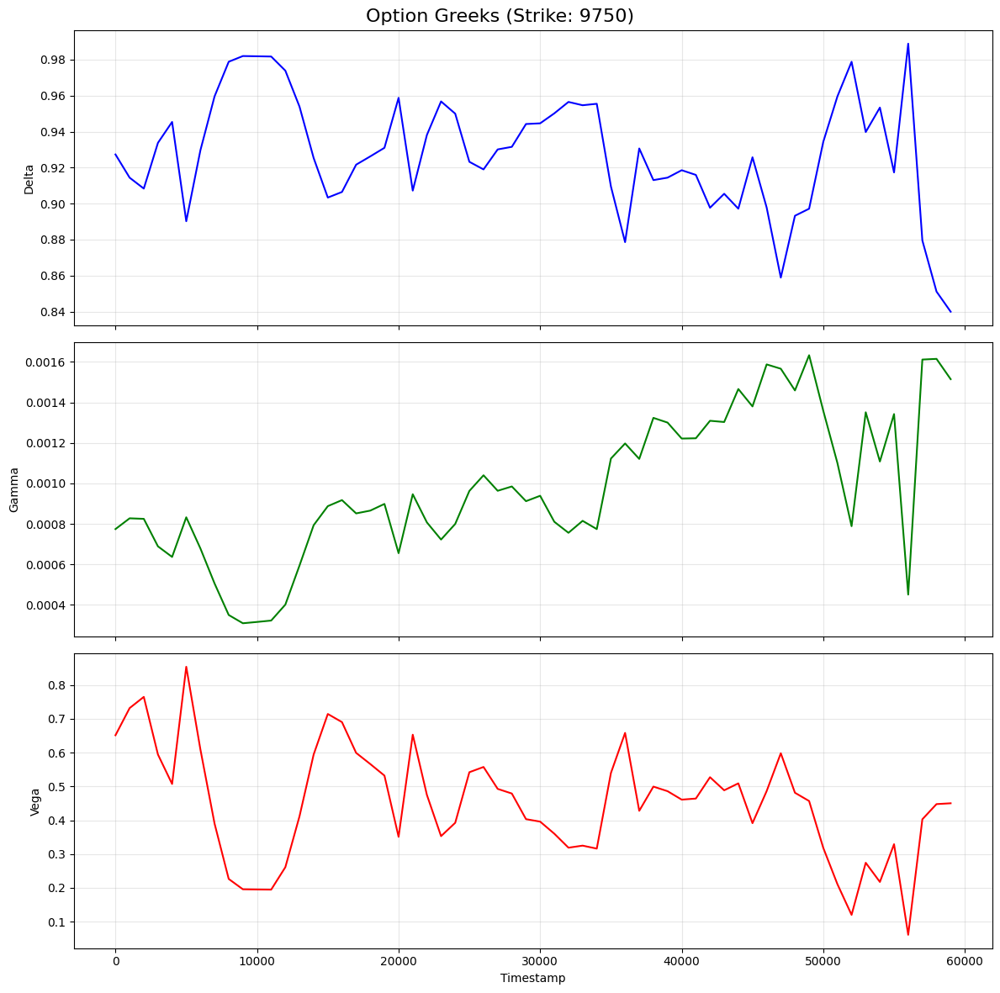


Analyzing rock_10000 (Strike: 10000)...


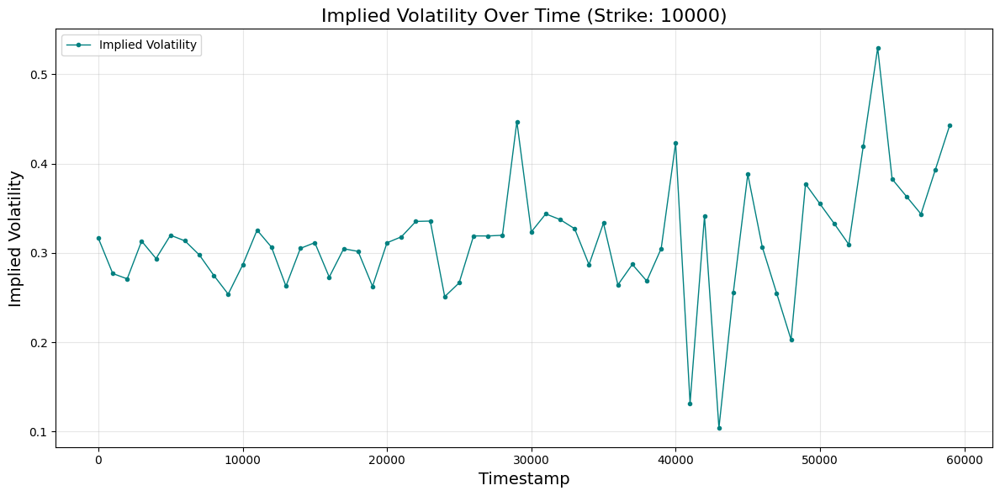

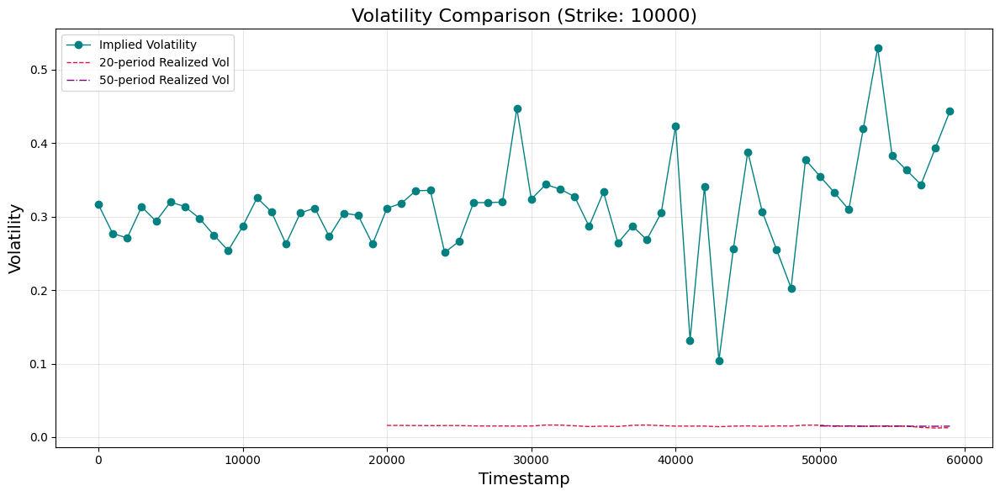

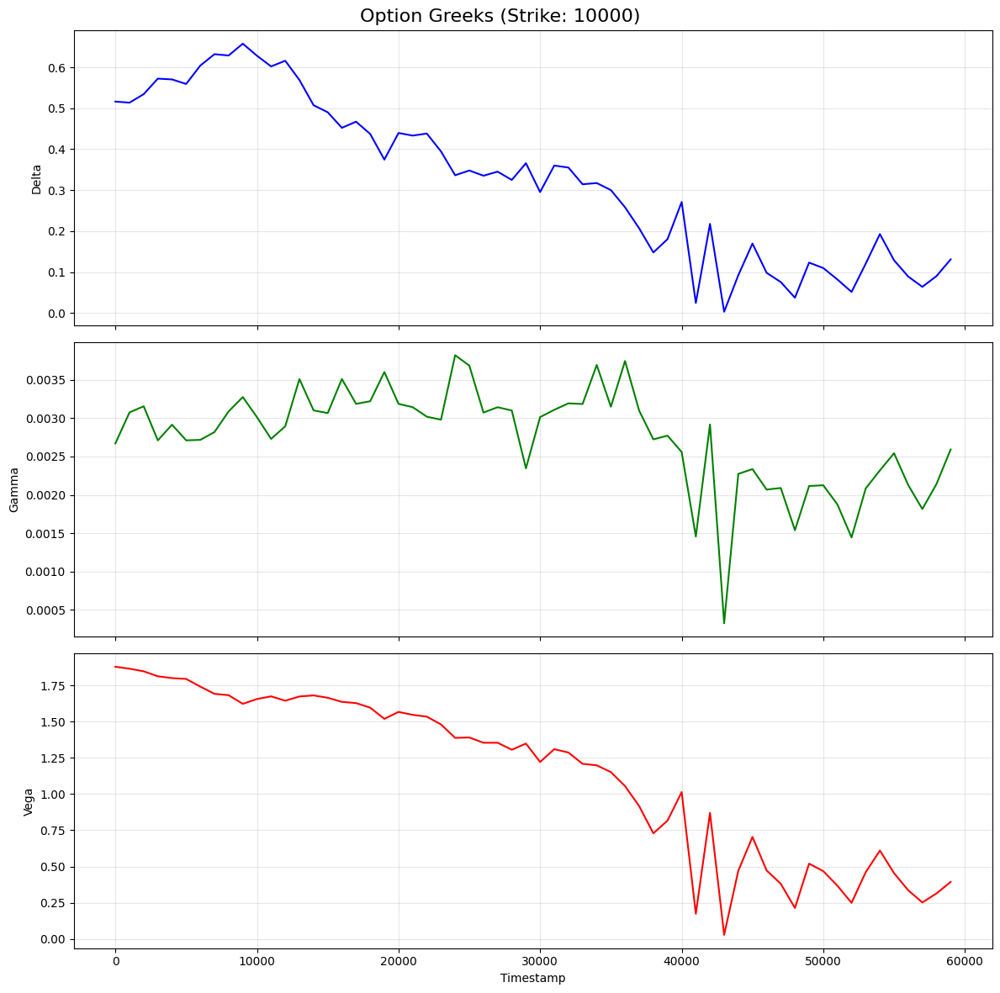


Analyzing rock_10250 (Strike: 10250)...


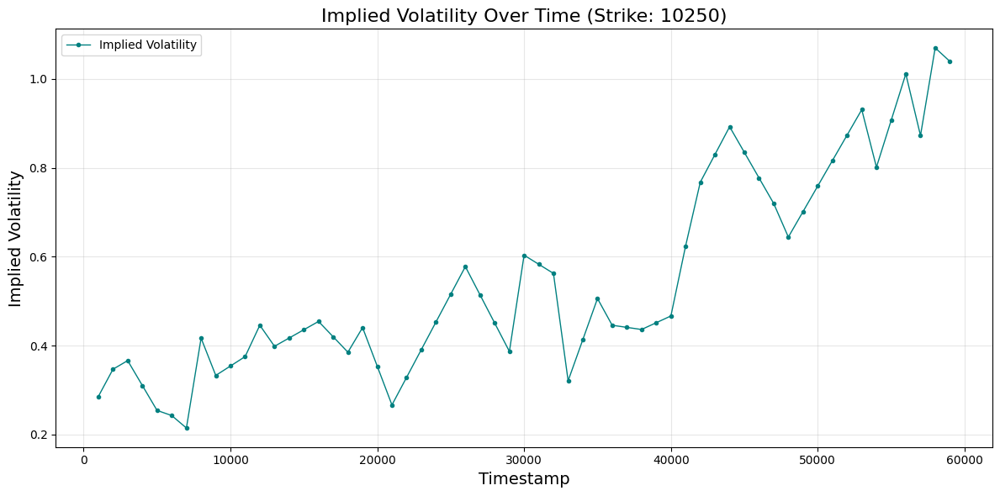

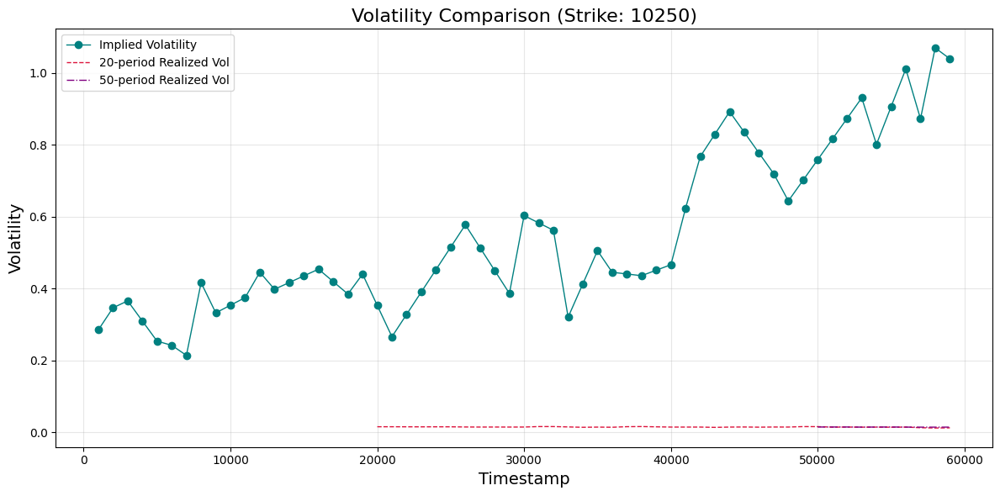

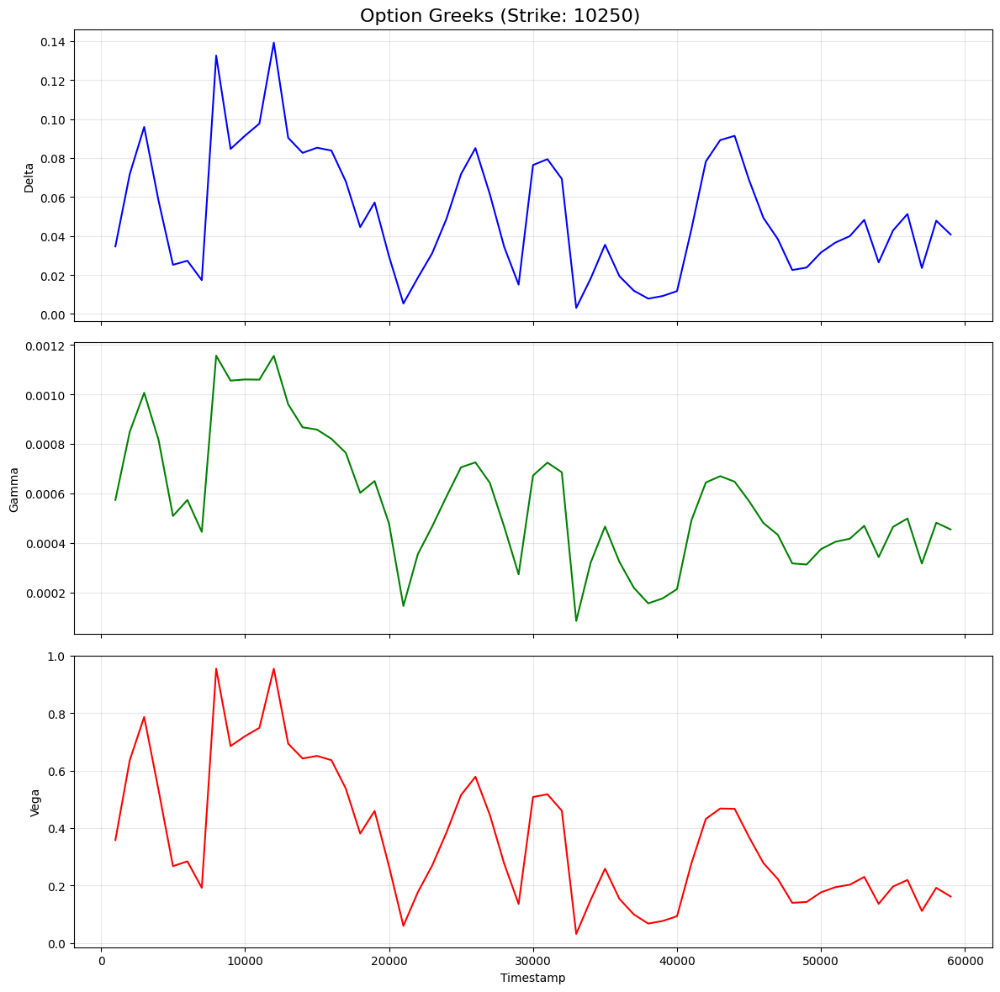


Analyzing rock_10500 (Strike: 10500)...


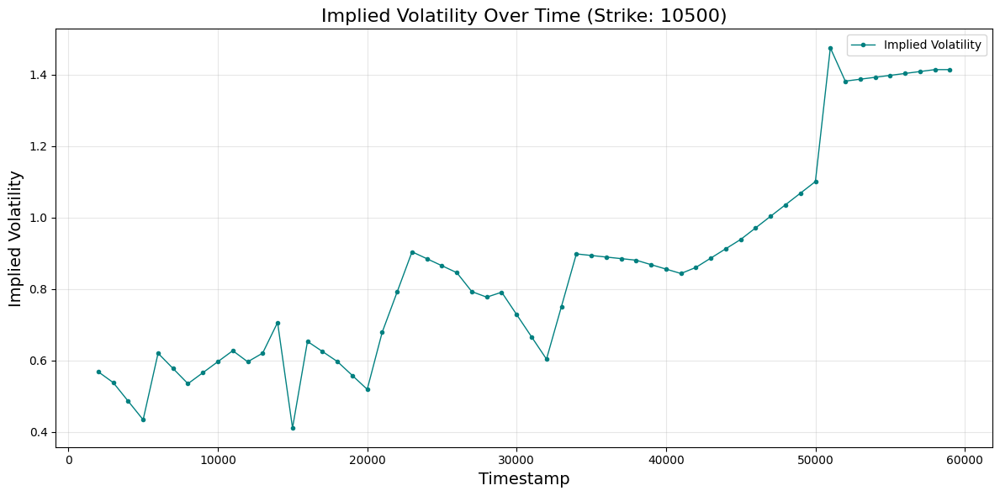

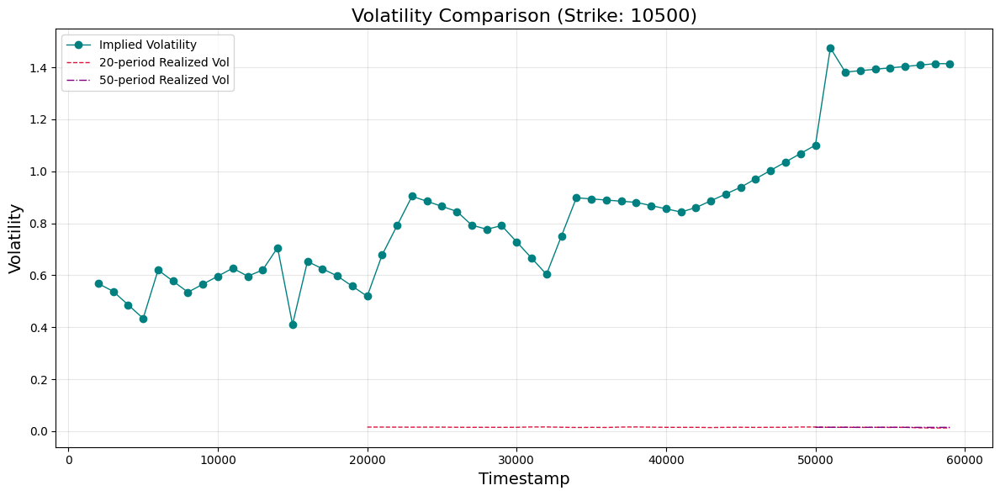

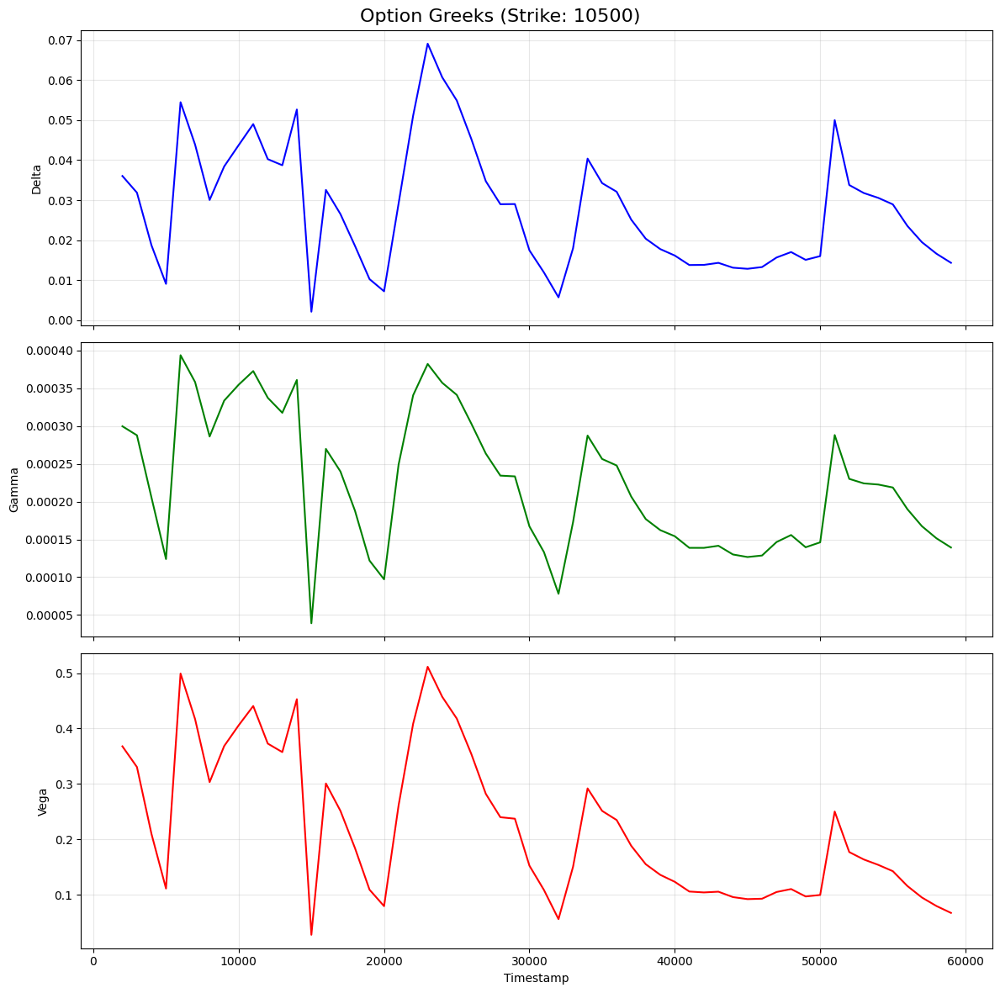

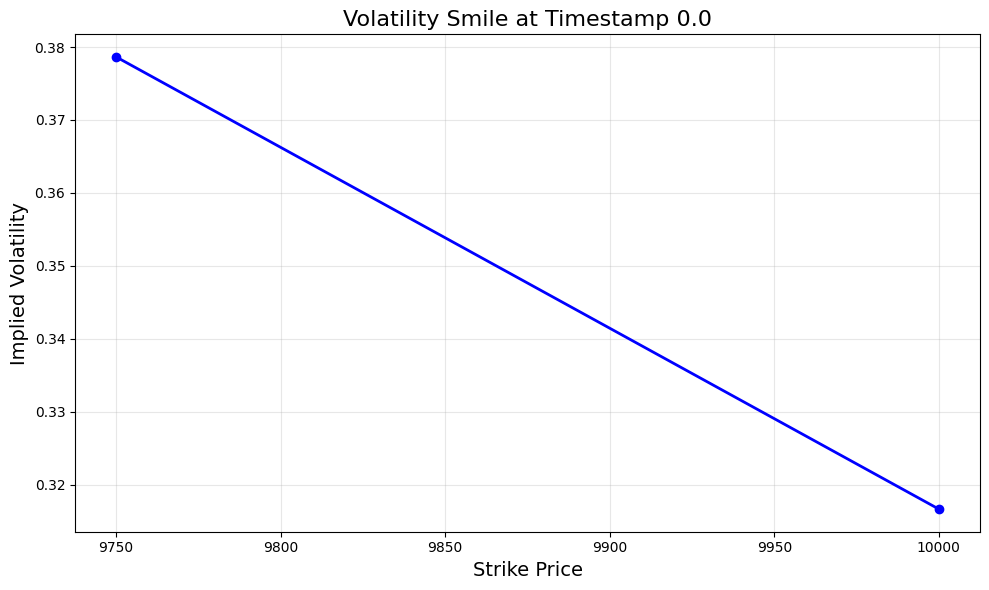

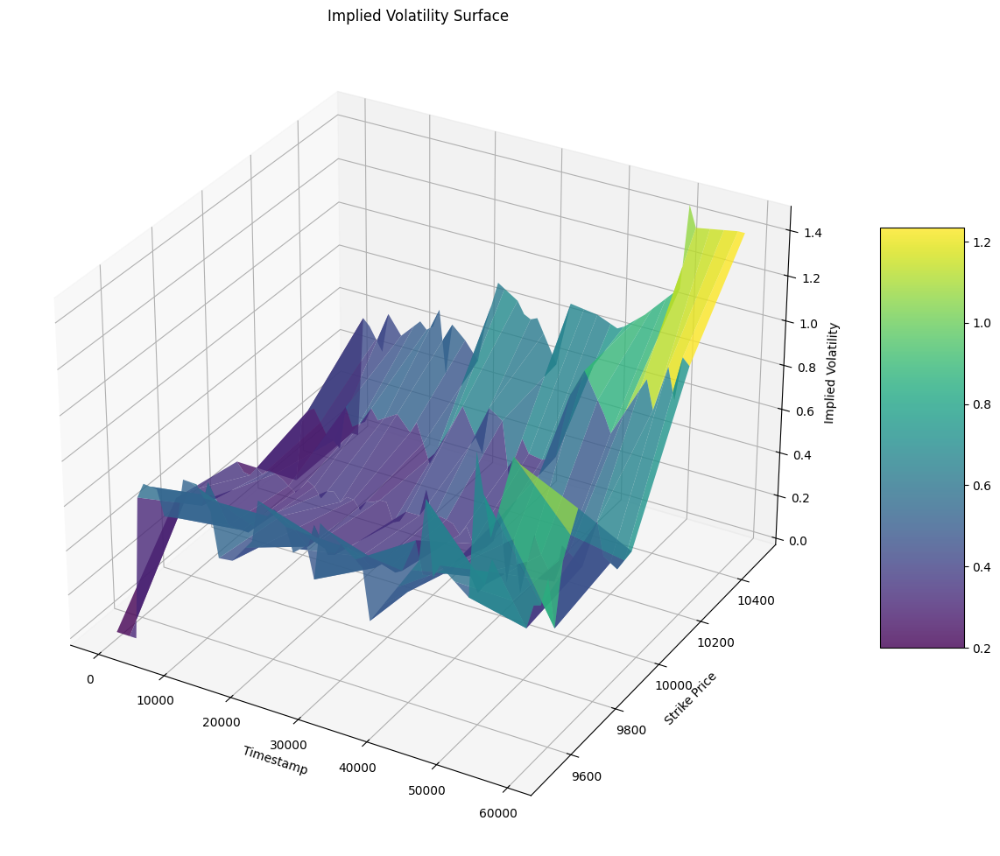


Summary Statistics:
rock_9500 - Avg. Implied Volatility: 0.7306
rock_9750 - Avg. Implied Volatility: 0.4105
rock_10000 - Avg. Implied Volatility: 0.3139
rock_10250 - Avg. Implied Volatility: 0.5463
rock_10500 - Avg. Implied Volatility: 0.8512


In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.optimize import brentq

# Black-Scholes and Greeks functions
def black_scholes_call(spot, strike, time_to_expiry, volatility, r=0.0):
    d1 = (np.log(spot / strike) + (r + 0.5 * volatility ** 2) * time_to_expiry) / (volatility * np.sqrt(time_to_expiry))
    d2 = d1 - volatility * np.sqrt(time_to_expiry)
    call_price = (spot * norm.cdf(d1) - strike * np.exp(-r * time_to_expiry) * norm.cdf(d2))
    return call_price

def black_scholes_put(spot, strike, time_to_expiry, volatility, r=0.0):
    d1 = (np.log(spot / strike) + (r + 0.5 * volatility ** 2) * time_to_expiry) / (volatility * np.sqrt(time_to_expiry))
    d2 = d1 - volatility * np.sqrt(time_to_expiry)
    put_price = (strike * np.exp(-r * time_to_expiry) * norm.cdf(-d2) - spot * norm.cdf(-d1))
    return put_price

def delta(spot, strike, time_to_expiry, volatility, option_type='call', r=0.0):
    d1 = (np.log(spot / strike) + (r + 0.5 * volatility ** 2) * time_to_expiry) / (volatility * np.sqrt(time_to_expiry))
    if option_type == 'call':
        return norm.cdf(d1)
    else:
        return norm.cdf(d1) - 1

def gamma(spot, strike, time_to_expiry, volatility, r=0.0):
    d1 = (np.log(spot / strike) + (r + 0.5 * volatility ** 2) * time_to_expiry) / (volatility * np.sqrt(time_to_expiry))
    return norm.pdf(d1) / (spot * volatility * np.sqrt(time_to_expiry))

def vega(spot, strike, time_to_expiry, volatility, r=0.0):
    d1 = (np.log(spot / strike) + (r + 0.5 * volatility ** 2) * time_to_expiry) / (volatility * np.sqrt(time_to_expiry))
    return spot * norm.pdf(d1) * np.sqrt(time_to_expiry) * 0.01  # 1% change in vol

def implied_volatility(option_price, spot, strike, time_to_expiry, option_type='call', r=0.0):
    def equation(volatility):
        if option_type == 'call':
            return black_scholes_call(spot, strike, time_to_expiry, volatility, r) - option_price
        else:
            return black_scholes_put(spot, strike, time_to_expiry, volatility, r) - option_price
    
    try:
        # Set reasonable bounds for volatility search
        implied_vol = brentq(equation, 1e-6, 5.0, xtol=1e-8)
        return implied_vol
    except ValueError:
        return np.nan

def realized_vol(data, window, step_size=1, annualization_factor=252):
    """
    Calculate realized volatility with proper annualization
    
    Parameters:
    -----------
    data: DataFrame
        Contains price data
    window: int
        Rolling window size
    step_size: int
        Step size for returns calculation
    annualization_factor: int
        Number of periods to annualize (default 252 for daily)
    """
    log_returns = np.log(data['underlying_price'] / data['underlying_price'].shift(step_size))
    squared_returns = log_returns ** 2
    realized_var = squared_returns.rolling(window).mean() * annualization_factor
    realized_vol = np.sqrt(realized_var)
    return realized_vol

def process_volcanic_rock_options(rock, rock_option, strike_price, expiry_timestamp=70000):
    """
    Process volcanic rock options data with advanced volatility metrics
    
    Parameters:
    -----------
    rock: DataFrame
        Underlying asset data with columns: timestamp, mid_price
    rock_option: DataFrame
        Option data with columns: timestamp, mid_price
    strike_price: float
        Strike price of the option
    expiry_timestamp: int
        Expiration time in seconds
    """
    # Merge underlying price data
    rock_option = pd.merge(
        rock_option,
        rock[['timestamp', 'mid_price']].rename(columns={'mid_price': 'underlying_price'}),
        on='timestamp',
        how='left'
    )
    
    # Calculate time to expiry in years
    rock_option['time_to_expiry'] = (expiry_timestamp - rock_option['timestamp']) / (365 * 24 * 60 * 60)
    
    # Calculate implied volatility
    rock_option['implied_vol'] = rock_option.apply(
        lambda row: implied_volatility(
            option_price=row['mid_price'],
            spot=row['underlying_price'],
            strike=strike_price,
            time_to_expiry=row['time_to_expiry'],
            option_type='call'
        ), axis=1
    )
    
    # Handle NaN values in implied_vol with interpolation
    rock_option['implied_vol'] = rock_option['implied_vol'].interpolate()
    
    # Calculate Greeks
    rock_option['delta'] = rock_option.apply(
        lambda row: delta(
            spot=row['underlying_price'],
            strike=strike_price,
            time_to_expiry=row['time_to_expiry'],
            volatility=row['implied_vol'],
            option_type='call'
        ), axis=1
    )
    
    rock_option['gamma'] = rock_option.apply(
        lambda row: gamma(
            spot=row['underlying_price'],
            strike=strike_price,
            time_to_expiry=row['time_to_expiry'],
            volatility=row['implied_vol']
        ), axis=1
    )
    
    rock_option['vega'] = rock_option.apply(
        lambda row: vega(
            spot=row['underlying_price'],
            strike=strike_price,
            time_to_expiry=row['time_to_expiry'],
            volatility=row['implied_vol']
        ), axis=1
    )
    
    # Calculate realized volatility
    rock_option['realized_vol_20'] = realized_vol(rock_option, window=20)
    rock_option['realized_vol_50'] = realized_vol(rock_option, window=50)
    
    return rock_option

# Plot functions
def plot_implied_volatility(data, title_suffix=""):
    if 'implied_vol' not in data.columns:
        raise ValueError("Implied volatility data not found in DataFrame")
        
    plt.figure(figsize=(12, 6))
    plt.plot(data['timestamp'], data['implied_vol'], 
             'o-', color='teal', linewidth=1, markersize=3, label='Implied Volatility')
    plt.title(f'Implied Volatility Over Time {title_suffix}', fontsize=16)
    plt.xlabel('Timestamp', fontsize=14)
    plt.ylabel('Implied Volatility', fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_volatility_comparison(data, title_suffix=""):
    plt.figure(figsize=(12, 6))
    
    if 'implied_vol' in data.columns:
        plt.plot(data['timestamp'], data['implied_vol'], 
                 'o-', color='teal', linewidth=1, label='Implied Volatility')
    
    if 'realized_vol_20' in data.columns:
        plt.plot(data['timestamp'], data['realized_vol_20'], 
                 '--', color='crimson', linewidth=1, label='20-period Realized Vol')
    
    if 'realized_vol_50' in data.columns:
        plt.plot(data['timestamp'], data['realized_vol_50'], 
                 '-.', color='purple', linewidth=1, label='50-period Realized Vol')
    
    plt.title(f'Volatility Comparison {title_suffix}', fontsize=16)
    plt.xlabel('Timestamp', fontsize=14)
    plt.ylabel('Volatility', fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_greeks(data, title_suffix=""):
    required_cols = ['delta', 'gamma', 'vega']
    if not all(col in data.columns for col in required_cols):
        raise ValueError("Missing Greek columns in DataFrame")
    
    fig, axs = plt.subplots(3, 1, figsize=(12, 12), sharex=True)
    
    axs[0].plot(data['timestamp'], data['delta'], 'b-')
    axs[0].set_ylabel('Delta')
    axs[0].grid(True, alpha=0.3)
    
    axs[1].plot(data['timestamp'], data['gamma'], 'g-')
    axs[1].set_ylabel('Gamma')
    axs[1].grid(True, alpha=0.3)
    
    axs[2].plot(data['timestamp'], data['vega'], 'r-')
    axs[2].set_ylabel('Vega')
    axs[2].set_xlabel('Timestamp')
    axs[2].grid(True, alpha=0.3)
    
    plt.suptitle(f'Option Greeks {title_suffix}', fontsize=16)
    plt.tight_layout()
    plt.show()

def plot_volatility_smile(results_dict, timestamp_idx=0):
    """
    Plot the volatility smile at a specific timestamp
    
    Parameters:
    -----------
    results_dict: dict
        Dictionary of processed dataframes with different strikes
    timestamp_idx: int
        Index of the timestamp to use for the smile
    """
    strikes = []
    implied_vols = []
    
    # Get the common timestamp
    common_timestamp = None
    for name, df in results_dict.items():
        if timestamp_idx < len(df):
            common_timestamp = df.iloc[timestamp_idx]['timestamp']
            break
    
    if common_timestamp is None:
        raise ValueError("Could not find a valid timestamp")
    
    # Extract implied volatilities at the specified timestamp
    for name, df in results_dict.items():
        strike = int(name.split('_')[1])
        df_at_timestamp = df[df['timestamp'] == common_timestamp]
        
        if not df_at_timestamp.empty and not pd.isna(df_at_timestamp['implied_vol'].values[0]):
            strikes.append(strike)
            implied_vols.append(df_at_timestamp['implied_vol'].values[0])
    
    # Sort by strike price
    strike_vol = sorted(zip(strikes, implied_vols), key=lambda x: x[0])
    strikes, implied_vols = zip(*strike_vol) if strike_vol else ([], [])
    
    # Plot volatility smile
    plt.figure(figsize=(10, 6))
    plt.plot(strikes, implied_vols, 'o-', color='blue', linewidth=2, markersize=6)
    plt.xlabel('Strike Price', fontsize=14)
    plt.ylabel('Implied Volatility', fontsize=14)
    plt.title(f'Volatility Smile at Timestamp {common_timestamp}', fontsize=16)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def plot_volatility_surface(results_dict):
    """
    Plot the volatility surface across all strikes and timestamps
    
    Parameters:
    -----------
    results_dict: dict
        Dictionary of processed dataframes with different strikes
    """
    # Prepare data for surface plot
    strikes = sorted([int(name.split('_')[1]) for name in results_dict.keys()])
    
    # Find common timestamps across all dataframes
    common_timestamps = set(results_dict[f'rock_{strikes[0]}']['timestamp'])
    for strike in strikes[1:]:
        common_timestamps &= set(results_dict[f'rock_{strike}']['timestamp'])
    common_timestamps = sorted(list(common_timestamps))
    
    if not common_timestamps:
        raise ValueError("No common timestamps found across all dataframes")
    
    # Create meshgrid for surface plot
    X, Y = np.meshgrid(common_timestamps, strikes)
    Z = np.zeros_like(X, dtype=float)
    
    # Fill Z with implied volatilities
    for i, strike in enumerate(strikes):
        df = results_dict[f'rock_{strike}']
        for j, timestamp in enumerate(common_timestamps):
            vol = df[df['timestamp'] == timestamp]['implied_vol'].values[0]
            Z[i, j] = vol if not pd.isna(vol) else 0
    
    # Create the 3D plot
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none', alpha=0.8)
    
    ax.set_xlabel('Timestamp')
    ax.set_ylabel('Strike Price')
    ax.set_zlabel('Implied Volatility')
    ax.set_title('Implied Volatility Surface')
    
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)
    plt.tight_layout()
    plt.show()

# Main function to process multiple dataframes
def process_all_options(rock, option_dfs, expiry_timestamp=70000):
    """
    Process all option dataframes with different strikes
    
    Parameters:
    -----------
    rock: DataFrame
        Underlying asset data
    option_dfs: dict
        Dictionary of option dataframes with keys as dataframe names
    expiry_timestamp: int
        Expiration timestamp
        
    Returns:
    --------
    results_dict: dict
        Dictionary of processed dataframes
    """
    results_dict = {}
    
    for name, df in option_dfs.items():
        # Extract strike price from dataframe name
        strike_price = int(name.split('_')[1])
        
        # Process option data
        processed_df = process_volcanic_rock_options(
            rock=rock,
            rock_option=df,
            strike_price=strike_price,
            expiry_timestamp=expiry_timestamp
        )
        
        # Store processed data
        results_dict[name] = processed_df
        
        # Plot individual results
        print(f"\nAnalyzing {name} (Strike: {strike_price})...")
        plot_implied_volatility(processed_df, title_suffix=f"(Strike: {strike_price})")
        plot_volatility_comparison(processed_df, title_suffix=f"(Strike: {strike_price})")
        plot_greeks(processed_df, title_suffix=f"(Strike: {strike_price})")
    
    # Plot volatility smile and surface
    plot_volatility_smile(results_dict)
    plot_volatility_surface(results_dict)
    
    return results_dict

# Example usage with sample data
if __name__ == "__main__":
    # Create sample data for the underlying asset (rock)
    np.random.seed(42)
    timestamps = np.arange(0, 60000, 1000)  # 60 seconds of data with 1-second intervals
    underlying_prices = 10000 + np.cumsum(np.random.normal(0, 10, len(timestamps)))
    rock = pd.DataFrame({
        'timestamp': timestamps,
        'mid_price': underlying_prices
    })

    # Create sample option dataframes with different strikes
    option_dfs = {}
    for strike in [9500, 9750, 10000, 10250, 10500]:
        option_prices = [
            black_scholes_call(s, strike, (70000-t)/365/24/60/60, 0.3) 
            + np.random.normal(0, 5) 
            for t, s in zip(timestamps, underlying_prices)
        ]
        
        option_dfs[f'rock_{strike}'] = pd.DataFrame({
            'timestamp': timestamps,
            'mid_price': option_prices
        })

    # Process all options
    results_dict = process_all_options(rock, option_dfs)
    
    # Print summary statistics
    print("\nSummary Statistics:")
    for name, df in results_dict.items():
        strike = name.split('_')[1]
        avg_iv = df['implied_vol'].mean()
        print(f"{name} - Avg. Implied Volatility: {avg_iv:.4f}")
